In [209]:
#import warnings
import warnings 
warnings.filterwarnings('ignore')

In [210]:
#import packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from scipy.stats import zscore
from sklearn.model_selection import KFold

In [211]:
# Import and store the data in a data frame. (2 points)
breastCancer_data =  pd.read_csv("wisc_bc_data.csv")

In [212]:
breastCancer_data.sample(n=4)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
365,921385,B,11.54,14.44,74.65,402.9,0.09984,0.11200,0.06737,0.02594,...,12.26,19.68,78.78,457.8,0.1345,0.21180,0.17970,0.06918,0.2329,0.08134
94,874858,M,14.22,23.12,94.37,609.9,0.10750,0.24130,0.19810,0.06618,...,15.74,37.18,106.40,762.4,0.1533,0.93270,0.84880,0.17720,0.5166,0.14460
490,914062,M,18.01,20.56,118.40,1007.0,0.10010,0.12890,0.11700,0.07762,...,21.53,26.06,143.40,1426.0,0.1309,0.23270,0.25440,0.14890,0.3251,0.07625
532,90769602,B,12.72,17.67,80.98,501.3,0.07896,0.04522,0.01402,0.01835,...,13.82,20.96,88.87,586.8,0.1068,0.09605,0.03469,0.03612,0.2165,0.06025


In [213]:
breastCancer_data.shape

(569, 32)

In [214]:
breastCancer_data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [215]:
breastCancer_data.var()

id                   1.563015e+16
radius_mean          1.241892e+01
texture_mean         1.849891e+01
perimeter_mean       5.904405e+02
area_mean            1.238436e+05
smoothness_mean      1.977997e-04
compactness_mean     2.789187e-03
concavity_mean       6.355248e-03
points_mean          1.505661e-03
symmetry_mean        7.515428e-04
dimension_mean       4.984872e-05
radius_se            7.690235e-02
texture_se           3.043159e-01
perimeter_se         4.087896e+00
area_se              2.069432e+03
smoothness_se        9.015114e-06
compactness_se       3.207029e-04
concavity_se         9.111982e-04
points_se            3.807242e-05
symmetry_se          6.833290e-05
dimension_se         7.001692e-06
radius_worst         2.336022e+01
texture_worst        3.777648e+01
perimeter_worst      1.129131e+03
area_worst           3.241674e+05
smoothness_worst     5.213198e-04
compactness_worst    2.475477e-02
concavity_worst      4.352409e-02
points_worst         4.320741e-03
symmetry_worst

In [216]:
breastCancer_data.isnull().sum()

id                   0
diagnosis            0
radius_mean          0
texture_mean         0
perimeter_mean       0
area_mean            0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
perimeter_se         0
area_se              0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
radius_worst         0
texture_worst        0
perimeter_worst      0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

In [217]:
#Drop "id" column from independent variables (2 point)

breastCancer_data = breastCancer_data.drop('id', 1)

In [218]:
breastCancer_data.head(5)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [219]:
#Convert Categorical values("M" and "B") of Dependent Variable -Y into numerical value ("1" and "0") respectively (2 points)
breastCancer_data = breastCancer_data.replace('M',1)
breastCancer_data = breastCancer_data.replace('B',0)
breastCancer_data.head(5)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,0,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,0,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,0,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,0,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [220]:
#Remove the outliers from the data (4 points)

# Detect observations with more than one outlier

def outlier_detection(df):
    """
    dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than 2 outliers. 
    """
    outlier_indices = []
    
    # iterate over features(columns)
    for col in df.columns.tolist():
        # 1st quartile (25%)
        Q1 = np.percentile(df[col], 25)
        
        # 3rd quartile (75%)
        Q3 = np.percentile(df[col],75)
        
        # Interquartile rrange (IQR)
        IQR = Q3 - Q1
        
        # outlier step
        outlier_step = 1.5 * IQR
        
        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step )].index
        
        # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        
    # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > 2 )
    
    return multiple_outliers  


In [221]:
features = breastCancer_data.columns[:-1].tolist()
features

['diagnosis',
 'radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'points_mean',
 'symmetry_mean',
 'dimension_mean',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'points_se',
 'symmetry_se',
 'dimension_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'smoothness_worst',
 'compactness_worst',
 'concavity_worst',
 'points_worst',
 'symmetry_worst']

In [222]:
print('The dataset contains %d observations with more than 2 outliers' %(len(outlier_detection(breastCancer_data[features])))) 

The dataset contains 77 observations with more than 2 outliers


In [223]:
outlier_data = outlier_detection(breastCancer_data[features])
breastCancer_data = breastCancer_data.drop(outlier_data).reset_index(drop=True)
breastCancer_data.shape

(492, 31)

In [224]:
#Treat “diagnosis” – 2nd Column as your Dependent Variable and Rest of the columns as Independent Variable and split the table. (3 points)
X = breastCancer_data[features[1:32]].head(5)
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst
0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827
1,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,...,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940
2,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,...,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998
3,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,...,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102
4,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,...,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487


In [225]:
y = breastCancer_data['diagnosis'].head(5)
y

0    0
1    0
2    0
3    0
4    0
Name: diagnosis, dtype: int64

In [226]:
#Drop the independent variables which has less than 0.1 correlation with the dependent variable (3 points)
breastCancer_cor = X.apply(zscore)  # convert all attributes to Z scale 

breastCancer_cor.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst
count,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,...,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00
mean,-4.440892e-16,-1.043610e-15,-1.065814e-15,-5.329071e-16,-6.661338e-16,1.332268e-16,-1.332268e-16,-9.547918e-16,-1.043610e-15,2.486900e-15,...,1.776357e-16,-1.332268e-15,4.884981e-16,-3.108624e-16,-3.996803e-16,-3.463896e-15,2.525757e-16,6.106227e-17,-1.271205e-15,5.107026e-16
std,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,...,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00,1.118034e+00
min,-8.996476e-01,-1.020727e+00,-8.348627e-01,-8.199275e-01,-1.709303e+00,-9.549285e-01,-1.054020e+00,-8.767615e-01,-1.003088e+00,-1.632962e+00,...,-1.246595e+00,-8.045847e-01,-8.079406e-01,-8.490387e-01,-7.845995e-01,-1.597336e+00,-1.177608e+00,-1.195948e+00,-1.322230e+00,-1.697732e+00
25%,-6.332647e-01,-6.942851e-01,-6.767594e-01,-6.195439e-01,-3.087008e-01,-9.322128e-01,-7.599185e-01,-6.934900e-01,-9.351804e-01,-3.817550e-01,...,-5.973895e-01,-7.798663e-01,-7.880949e-01,-6.784903e-01,-7.217660e-01,-7.601779e-01,-6.672484e-01,-6.313797e-01,-5.754205e-01,-5.485991e-01
50%,-4.879650e-01,-6.226273e-01,-4.762381e-01,-5.328108e-01,1.719696e-01,-5.344468e-01,-2.564704e-01,-6.765205e-01,-4.501283e-01,-2.557210e-02,...,-5.220757e-01,-4.770656e-01,-7.792746e-01,-5.176875e-01,-4.663340e-01,7.216878e-01,-6.474010e-02,-1.376294e-01,-1.952266e-01,4.662197e-01
75%,1.416673e-01,7.468342e-01,8.772807e-02,6.011505e-02,5.698217e-01,1.184212e+00,2.927458e-01,5.034308e-01,1.014729e+00,7.902998e-01,...,1.089641e+00,1.965115e-01,8.017664e-01,1.684044e-01,6.433607e-02,7.409328e-01,1.360960e-01,2.009423e-01,4.580432e-01,8.034978e-01
max,1.879210e+00,1.590805e+00,1.900132e+00,1.912167e+00,1.276212e+00,1.237376e+00,1.777664e+00,1.743341e+00,1.373667e+00,1.249989e+00,...,1.276419e+00,1.865005e+00,1.573544e+00,1.876812e+00,1.908363e+00,8.948929e-01,1.773501e+00,1.764015e+00,1.634834e+00,9.766139e-01


In [227]:
breastCancer_cor.var()

radius_mean          1.25
texture_mean         1.25
perimeter_mean       1.25
area_mean            1.25
smoothness_mean      1.25
compactness_mean     1.25
concavity_mean       1.25
points_mean          1.25
symmetry_mean        1.25
dimension_mean       1.25
radius_se            1.25
texture_se           1.25
perimeter_se         1.25
area_se              1.25
smoothness_se        1.25
compactness_se       1.25
concavity_se         1.25
points_se            1.25
symmetry_se          1.25
dimension_se         1.25
radius_worst         1.25
texture_worst        1.25
perimeter_worst      1.25
area_worst           1.25
smoothness_worst     1.25
compactness_worst    1.25
concavity_worst      1.25
points_worst         1.25
symmetry_worst       1.25
dtype: float64

In [228]:
X.head(5)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst
0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827
1,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,...,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940
2,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,...,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998
3,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,...,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102
4,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,...,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487


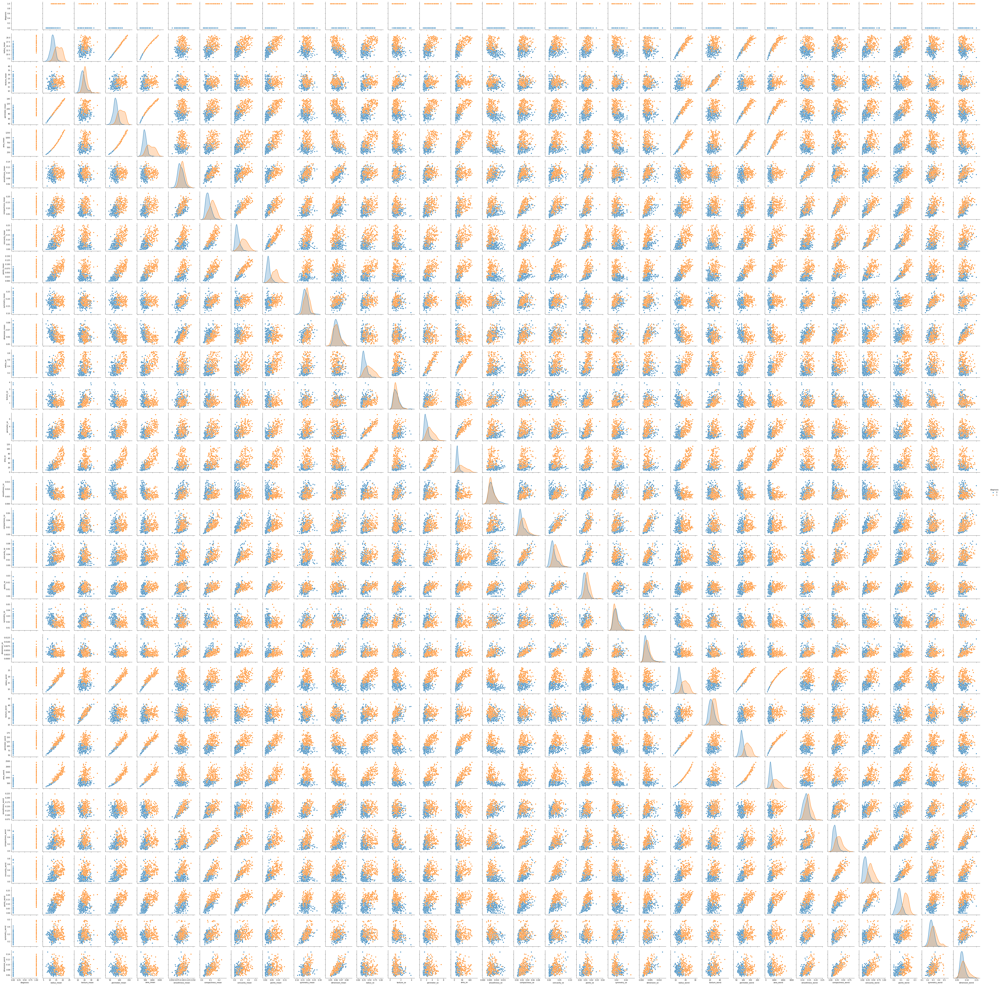

In [229]:
#Create scatter Plot of Independent Variable vs Dependent Variable. (2 points)
sns.pairplot(breastCancer_data, hue="diagnosis")


In [235]:
#Divide the data set into training and test data set and build a KNN model. (5 points)
seed = 50
test_size = 0.2

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size , random_state = seed)

In [243]:
# Print the optimal value of K using Mis-classification error and the corresponding accuracy for the model (5 points)

NNH = KNeighborsClassifier(n_neighbors= 4 , weights = 'distance' )

In [244]:
# Call Nearest Neighbour algorithm

NNH.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=4, p=2,
           weights='distance')

In [245]:
predicted_labels = NNH.predict(X_test)
NNH.score(X_test, y_test)

1.0

In [255]:
# creating odd list of K for KNN
myList = list(range(1,3))


# empty list that will hold cv scores
cv_scores = []
k_neighbors = []

# perform 10-fold cross validation
for k in myList:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=2, scoring='accuracy')
    cv_scores.append(scores.mean())
    k_neighbors.append(k)


MSE = [1 - x for x in cv_scores]
min(MSE)
MSE.index(min(MSE))
best_k = myList[MSE.index(min(MSE))]
print ("The optimal number of neighbors is %d" % best_k)

The optimal number of neighbors is 1


In [ ]:
#since 1.0 accuracy there only 1 

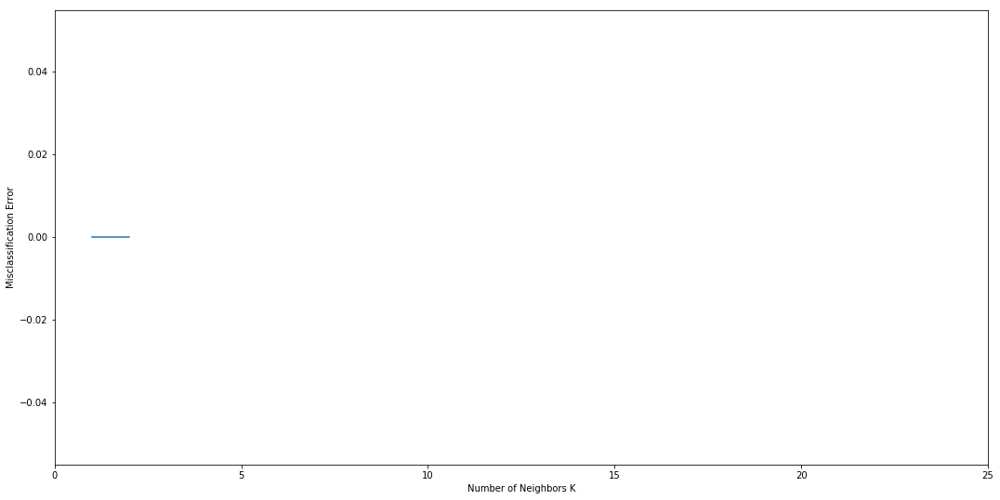

In [256]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 18
fig_size[1] = 9
plt.rcParams["figure.figsize"] = fig_size

plt.xlim(0,25)


# plot misclassification error vs k
plt.plot(k_neighbors, MSE)



plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()
